##  La guerre des SOTA (ConvNeXt vs Swin)

Dans cette section, l’objectif est de comparer et d’analyser le comportement de deux architectures de réseaux de neurones — ConvNeXt (CNN) et Swin Transformer — sur le jeu de test ImageNet-R-mini. Après les avoir finetuné sur 21 classes de ce data set et évalué leurs performances globales et par classe, nous allons explorer les raisons de leurs succès ou échecs respectifs à l’aide de méthodes d’interprétabilité visuelle.

Pour cela, nous utiliserons trois techniques complémentaires :

Grad-CAM pour visualiser les régions de l’image qui influencent le plus la décision du modèle,
Integrated Gradients pour attribuer une importance à chaque pixel,
Occlusion pour identifier les zones critiques en masquant localement l’image.
L’analyse portera sur des exemples où les modèles réussissent ou échouent différemment, afin de mieux comprendre leurs stratégies de classification et les biais éventuels liés à leur architecture.
L’objectif final est d’illustrer, par des visualisations concrètes, les différences de fonctionnement entre un CNN et un Transformer sur des images complexes et variées.

In [11]:
import torch
import torch.nn as nn
from torchvision import transforms
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import os

# Imports pour Grad-CAM
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

# Importer les fonctions du dataloader et models
from step4.dataloader import get_test_loader
from step4.models import get_convnext_model

# Configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"  Device: {device}")

  Device: cuda


In [12]:
!pip install datasets
from datasets import load_dataset

# Installation de la bibliothèque pytorch-grad-cam
!pip install grad-cam

### Test du DataLoader
Visualisation de quelques images du dataset

In [13]:
import sys
from pathlib import Path

# Ajouter le dossier step4 au path
# sys.path.insert(0, str(Path.cwd() / 'step4'))

# Importer les fonctions du dataloader
from step4.dataloader import get_test_loader, imshow_batch

# Charger le dataloader
test_loader, class_names = get_test_loader()
print(f"\n Classes : {class_names}")
print(f"   Nombre de classes : {len(class_names)}\n")

 Dataset de TEST chargé depuis : /home/essakhi/5A/minis-projets/HDDL_Projects/mini-project-3/step4/data/imagenet-r-mini
   - Nombre d'images : 3740
   - Classes trouvées : ['ant', 'boxer', 'cannon', 'carousel', 'dalmatian', 'electric_guitar', 'french_bulldog', 'golden_retriever', 'goose', 'hotdog', 'jellyfish', 'ladybug', 'lion', 'lipstick', 'meerkat', 'missile', 'school_bus', 'spider_web', 'tank', 'toucan', 'vase']

 Classes : ['ant', 'boxer', 'cannon', 'carousel', 'dalmatian', 'electric_guitar', 'french_bulldog', 'golden_retriever', 'goose', 'hotdog', 'jellyfish', 'ladybug', 'lion', 'lipstick', 'meerkat', 'missile', 'school_bus', 'spider_web', 'tank', 'toucan', 'vase']
   Nombre de classes : 21



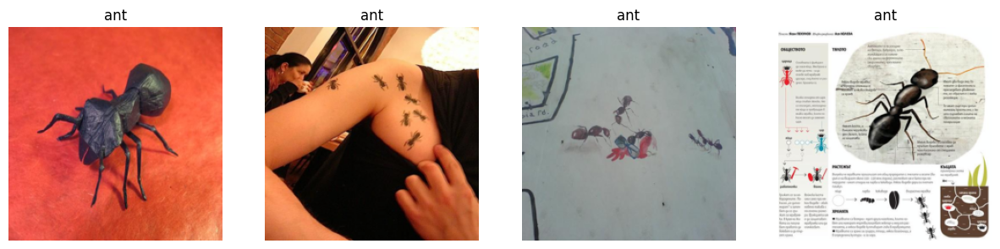

In [14]:
# Visualiser 4 images avec leurs classes
imshow_batch(test_loader, class_names)

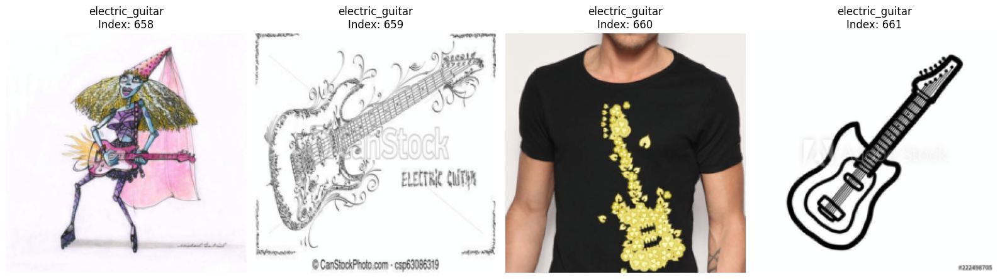

In [15]:

from step4.dataloader import imshow_batch_by_class

classe = 'electric_guitar'  # ou l'index de la classe
offset = 16 

imshow_batch_by_class(test_loader, class_names, classe, offset=offset, n_images=4)

### Test des modèles importés 


In [16]:
from step4.models import get_convnext_model, get_swin_model

# On a 21 classes dans notre mini-dataset
nb_classes = 21

# 1. Charger ConvNeXt
model_cnn = get_convnext_model(nb_classes)
print(f" ConvNeXt chargé. Sortie finale : {model_cnn.classifier[2]}")

# 2. Charger Swin
model_vit = get_swin_model(nb_classes)
print(f" Swin chargé. Sortie finale : {model_vit.head}")

 Chargement de ConvNeXt-Tiny (SOTA CNN)...
 ConvNeXt chargé. Sortie finale : Linear(in_features=768, out_features=21, bias=True)
 Chargement de Swin Transformer-Tiny (SOTA ViT)...
 Swin chargé. Sortie finale : Linear(in_features=768, out_features=21, bias=True)


### Visualisation de l'évolution de la Loss et de l'Accuracy pendant l'entraînement

In [17]:
import numpy as np
import matplotlib.pyplot as plt
import os

# Chargement des métriques depuis le checkpoint
checkpoint_dir = 'step4/checkpoints/convnext'
metrics_path = os.path.join(checkpoint_dir, 'metrics.npy')

# Chargement du fichier metrics.npy
metrics = np.load(metrics_path, allow_pickle=True).item()

print("Métriques disponibles:", metrics.keys())
print("\nNombre d'époques enregistrées:", len(metrics.get('train_loss', [])))


Métriques disponibles: dict_keys(['train_loss', 'train_acc', 'val_loss', 'val_acc'])

Nombre d'époques enregistrées: 5


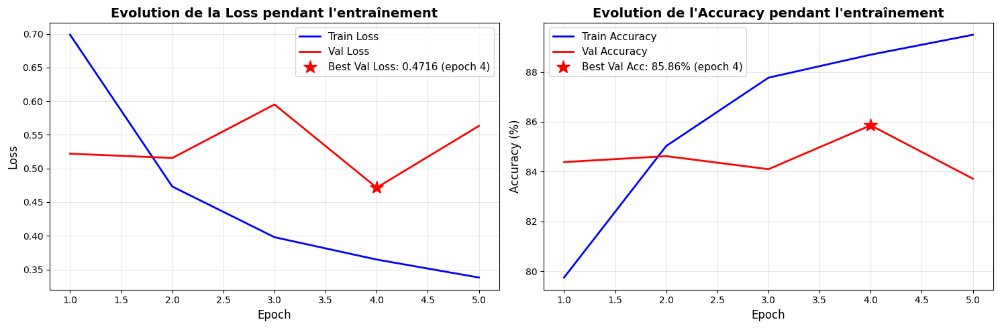


✓ Graphique sauvegardé dans: step4/checkpoints/training_evolution.png


In [18]:
# 2 sous-graphiques
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Graphique 1: Evolution de la Loss
if 'train_loss' in metrics and 'val_loss' in metrics:
    epochs = range(1, len(metrics['train_loss']) + 1)
    
    axes[0].plot(epochs, metrics['train_loss'], 'b-', label='Train Loss', linewidth=2)
    axes[0].plot(epochs, metrics['val_loss'], 'r-', label='Val Loss', linewidth=2)
    axes[0].set_xlabel('Epoch', fontsize=12)
    axes[0].set_ylabel('Loss', fontsize=12)
    axes[0].set_title('Evolution de la Loss pendant l\'entraînement', fontsize=14, fontweight='bold')
    axes[0].legend(fontsize=11)
    axes[0].grid(True, alpha=0.3)
    
    
    min_val_loss_idx = np.argmin(metrics['val_loss'])
    min_val_loss = metrics['val_loss'][min_val_loss_idx]
    axes[0].plot(min_val_loss_idx + 1, min_val_loss, 'r*', markersize=15, 
                 label=f'Best Val Loss: {min_val_loss:.4f} (epoch {min_val_loss_idx + 1})')
    axes[0].legend(fontsize=11)

# Graphique 2: Evolution de l'Accuracy
if 'train_acc' in metrics and 'val_acc' in metrics:
    epochs = range(1, len(metrics['train_acc']) + 1)
    
    axes[1].plot(epochs, metrics['train_acc'], 'b-', label='Train Accuracy', linewidth=2)
    axes[1].plot(epochs, metrics['val_acc'], 'r-', label='Val Accuracy', linewidth=2)
    axes[1].set_xlabel('Epoch', fontsize=12)
    axes[1].set_ylabel('Accuracy (%)', fontsize=12)
    axes[1].set_title('Evolution de l\'Accuracy pendant l\'entraînement', fontsize=14, fontweight='bold')
    axes[1].legend(fontsize=11)
    axes[1].grid(True, alpha=0.3)
    

    max_val_acc_idx = np.argmax(metrics['val_acc'])
    max_val_acc = metrics['val_acc'][max_val_acc_idx]
    axes[1].plot(max_val_acc_idx + 1, max_val_acc, 'r*', markersize=15,
                 label=f'Best Val Acc: {max_val_acc:.2f}% (epoch {max_val_acc_idx + 1})')
    axes[1].legend(fontsize=11)

plt.tight_layout()
plt.savefig('step4/checkpoints/training_evolution.png', dpi=300, bbox_inches='tight')
plt.show()

print(f"\n✓ Graphique sauvegardé dans: step4/checkpoints/training_evolution.png")


In [19]:

print("="*60)
print("STATISTIQUES D'ENTRAÎNEMENT - ConvNeXt")
print("="*60)

if 'train_loss' in metrics and 'val_loss' in metrics:
    print(f"\n LOSS:")
    print(f"  Train Loss - Initial: {metrics['train_loss'][0]:.4f} | Final: {metrics['train_loss'][-1]:.4f}")
    print(f"  Val Loss   - Initial: {metrics['val_loss'][0]:.4f} | Final: {metrics['val_loss'][-1]:.4f}")
    print(f"  Meilleure Val Loss: {min(metrics['val_loss']):.4f} (Epoch {np.argmin(metrics['val_loss']) + 1})")

if 'train_acc' in metrics and 'val_acc' in metrics:
    print(f"\n ACCURACY:")
    print(f"  Train Acc - Initial: {metrics['train_acc'][0]:.2f}% | Final: {metrics['train_acc'][-1]:.2f}%")
    print(f"  Val Acc   - Initial: {metrics['val_acc'][0]:.2f}% | Final: {metrics['val_acc'][-1]:.2f}%")
    print(f"  Meilleure Val Acc: {max(metrics['val_acc']):.2f}% (Epoch {np.argmax(metrics['val_acc']) + 1})")

print(f"\n Nombre total d'époques: {len(metrics['train_loss'])}")
print("="*60)


STATISTIQUES D'ENTRAÎNEMENT - ConvNeXt

 LOSS:
  Train Loss - Initial: 0.6988 | Final: 0.3380
  Val Loss   - Initial: 0.5220 | Final: 0.5633
  Meilleure Val Loss: 0.4716 (Epoch 4)

 ACCURACY:
  Train Acc - Initial: 79.74% | Final: 89.50%
  Val Acc   - Initial: 84.38% | Final: 83.71%
  Meilleure Val Acc: 85.86% (Epoch 4)

 Nombre total d'époques: 5


### Visualisation de l'évolution de la Loss et de l'Accuracy pendant l'entraînement - Swin Transformer

In [20]:

checkpoint_dir_swin = 'step4/checkpoints/swin_lr0001_bs64'
metrics_path_swin = os.path.join(checkpoint_dir_swin, 'metrics.npy')

metrics_swin = np.load(metrics_path_swin, allow_pickle=True).item()

print("Métriques disponibles:", metrics_swin.keys())
print("\nNombre d'époques enregistrées:", len(metrics_swin.get('train_loss', [])))

Métriques disponibles: dict_keys(['train_loss', 'train_acc', 'val_loss', 'val_acc'])

Nombre d'époques enregistrées: 5


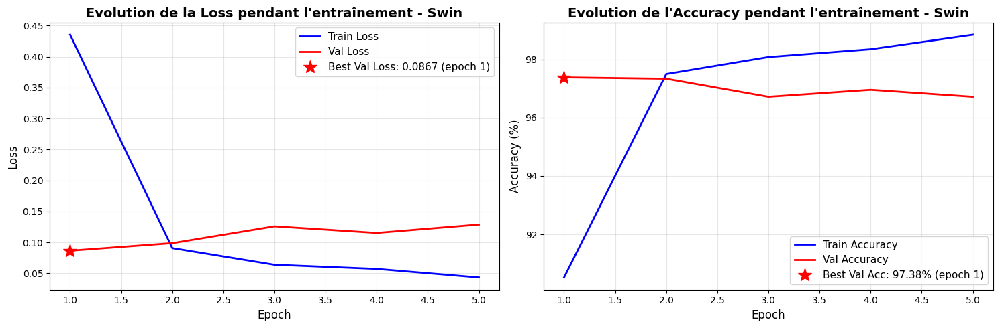


✓ Graphique sauvegardé dans: step4/checkpoints/swin_training_evolution.png


In [21]:
# Créer une figure avec 2 sous-graphiques pour Swin
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Graphique 1: Evolution de la Loss
if 'train_loss' in metrics_swin and 'val_loss' in metrics_swin:
    epochs = range(1, len(metrics_swin['train_loss']) + 1)
    
    axes[0].plot(epochs, metrics_swin['train_loss'], 'b-', label='Train Loss', linewidth=2)
    axes[0].plot(epochs, metrics_swin['val_loss'], 'r-', label='Val Loss', linewidth=2)
    axes[0].set_xlabel('Epoch', fontsize=12)
    axes[0].set_ylabel('Loss', fontsize=12)
    axes[0].set_title('Evolution de la Loss pendant l\'entraînement - Swin', fontsize=14, fontweight='bold')
    axes[0].legend(fontsize=11)
    axes[0].grid(True, alpha=0.3)
    

    min_val_loss_idx = np.argmin(metrics_swin['val_loss'])
    min_val_loss = metrics_swin['val_loss'][min_val_loss_idx]
    axes[0].plot(min_val_loss_idx + 1, min_val_loss, 'r*', markersize=15, 
      label=f'Best Val Loss: {min_val_loss:.4f} (epoch {min_val_loss_idx + 1})')
    axes[0].legend(fontsize=11)

# Graphique 2: Evolution de l'Accuracy
if 'train_acc' in metrics_swin and 'val_acc' in metrics_swin:
    epochs = range(1, len(metrics_swin['train_acc']) + 1)
    
    axes[1].plot(epochs, metrics_swin['train_acc'], 'b-', label='Train Accuracy', linewidth=2)
    axes[1].plot(epochs, metrics_swin['val_acc'], 'r-', label='Val Accuracy', linewidth=2)
    axes[1].set_xlabel('Epoch', fontsize=12)
    axes[1].set_ylabel('Accuracy (%)', fontsize=12)
    axes[1].set_title('Evolution de l\'Accuracy pendant l\'entraînement - Swin', fontsize=14, fontweight='bold')
    axes[1].legend(fontsize=11)
    axes[1].grid(True, alpha=0.3)
    

    max_val_acc_idx = np.argmax(metrics_swin['val_acc'])
    max_val_acc = metrics_swin['val_acc'][max_val_acc_idx]
    axes[1].plot(max_val_acc_idx + 1, max_val_acc, 'r*', markersize=15,
                 label=f'Best Val Acc: {max_val_acc:.2f}% (epoch {max_val_acc_idx + 1})')
    axes[1].legend(fontsize=11)

plt.tight_layout()
plt.savefig('step4/checkpoints/swin_training_evolution.png', dpi=300, bbox_inches='tight')
plt.show()

print(f"\n✓ Graphique sauvegardé dans: step4/checkpoints/swin_training_evolution.png")

In [22]:

print("="*60)
print("STATISTIQUES D'ENTRAÎNEMENT - Swin Transformer")
print("="*60)

if 'train_loss' in metrics_swin and 'val_loss' in metrics_swin:
    print(f"\n LOSS:")
    print(f"  Train Loss - Initial: {metrics_swin['train_loss'][0]:.4f} | Final: {metrics_swin['train_loss'][-1]:.4f}")
    print(f"  Val Loss   - Initial: {metrics_swin['val_loss'][0]:.4f} | Final: {metrics_swin['val_loss'][-1]:.4f}")
    print(f"  Meilleure Val Loss: {min(metrics_swin['val_loss']):.4f} (Epoch {np.argmin(metrics_swin['val_loss']) + 1})")

if 'train_acc' in metrics_swin and 'val_acc' in metrics_swin:
    print(f"\n ACCURACY:")
    print(f"  Train Acc - Initial: {metrics_swin['train_acc'][0]:.2f}% | Final: {metrics_swin['train_acc'][-1]:.2f}%")
    print(f"  Val Acc   - Initial: {metrics_swin['val_acc'][0]:.2f}% | Final: {metrics_swin['val_acc'][-1]:.2f}%")
    print(f"  Meilleure Val Acc: {max(metrics_swin['val_acc']):.2f}% (Epoch {np.argmax(metrics_swin['val_acc']) + 1})")

print(f"\n Nombre total d'époques: {len(metrics_swin['train_loss'])}")
print("="*60)

STATISTIQUES D'ENTRAÎNEMENT - Swin Transformer

 LOSS:
  Train Loss - Initial: 0.4353 | Final: 0.0434
  Val Loss   - Initial: 0.0867 | Final: 0.1290
  Meilleure Val Loss: 0.0867 (Epoch 1)

 ACCURACY:
  Train Acc - Initial: 90.52% | Final: 98.84%
  Val Acc   - Initial: 97.38% | Final: 96.71%
  Meilleure Val Acc: 97.38% (Epoch 1)

 Nombre total d'époques: 5


### Comparaison ConvNeXt vs Swin Transformer

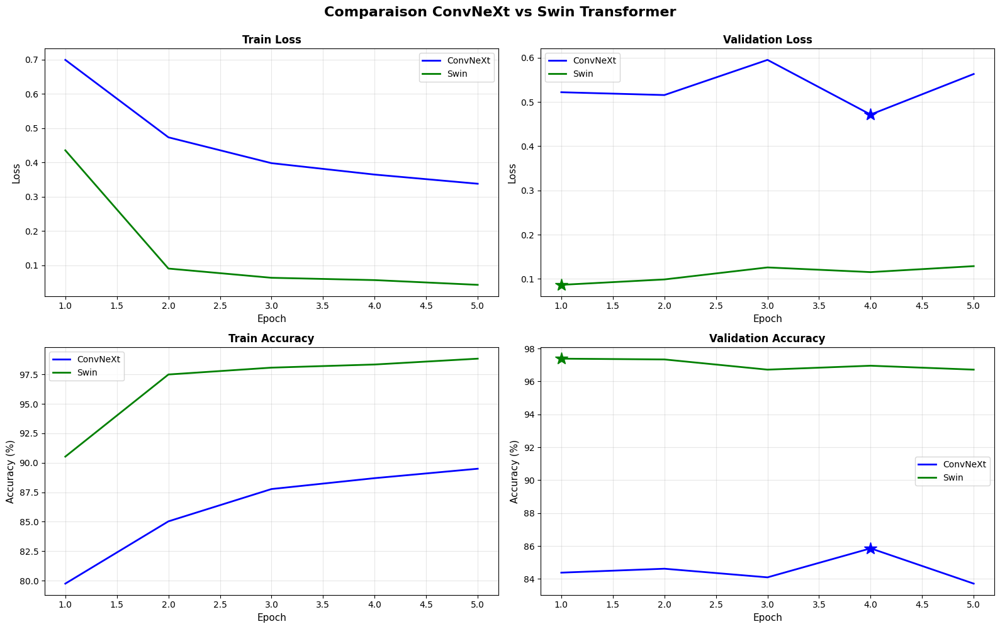


✓ Graphique de comparaison sauvegardé dans: step4/checkpoints/comparison_convnext_vs_swin.png


In [23]:
import matplotlib.pyplot as plt
# Comparaison visuelle des deux modèles
fig, axes = plt.subplots(2, 2, figsize=(16, 10))

# Ajuster l'espacement entre les subplots
fig.suptitle('Comparaison ConvNeXt vs Swin Transformer', fontsize=16, fontweight='bold', y=0.995)

# Ligne 1: Loss
epochs_convnext = range(1, len(metrics['train_loss']) + 1)
epochs_swin = range(1, len(metrics_swin['train_loss']) + 1)

# Loss - Train
axes[0, 0].plot(epochs_convnext, metrics['train_loss'], 'b-', label='ConvNeXt', linewidth=2)
axes[0, 0].plot(epochs_swin, metrics_swin['train_loss'], 'g-', label='Swin', linewidth=2)
axes[0, 0].set_xlabel('Epoch', fontsize=11)
axes[0, 0].set_ylabel('Loss', fontsize=11)
axes[0, 0].set_title('Train Loss', fontsize=12, fontweight='bold')
axes[0, 0].legend(fontsize=10)
axes[0, 0].grid(True, alpha=0.3)

# Loss - Validation
axes[0, 1].plot(epochs_convnext, metrics['val_loss'], 'b-', label='ConvNeXt', linewidth=2)
axes[0, 1].plot(epochs_swin, metrics_swin['val_loss'], 'g-', label='Swin', linewidth=2)
axes[0, 1].set_xlabel('Epoch', fontsize=11)
axes[0, 1].set_ylabel('Loss', fontsize=11)
axes[0, 1].set_title('Validation Loss', fontsize=12, fontweight='bold')
axes[0, 1].legend(fontsize=10)
axes[0, 1].grid(True, alpha=0.3)

# Marquer les meilleurs points
min_val_loss_convnext_idx = np.argmin(metrics['val_loss'])
min_val_loss_swin_idx = np.argmin(metrics_swin['val_loss'])
axes[0, 1].plot(min_val_loss_convnext_idx + 1, metrics['val_loss'][min_val_loss_convnext_idx], 
                'b*', markersize=15)
axes[0, 1].plot(min_val_loss_swin_idx + 1, metrics_swin['val_loss'][min_val_loss_swin_idx], 
                'g*', markersize=15)

# Ligne 2: Accuracy
# Accuracy - Train
axes[1, 0].plot(epochs_convnext, metrics['train_acc'], 'b-', label='ConvNeXt', linewidth=2)
axes[1, 0].plot(epochs_swin, metrics_swin['train_acc'], 'g-', label='Swin', linewidth=2)
axes[1, 0].set_xlabel('Epoch', fontsize=11)
axes[1, 0].set_ylabel('Accuracy (%)', fontsize=11)
axes[1, 0].set_title('Train Accuracy', fontsize=12, fontweight='bold')
axes[1, 0].legend(fontsize=10)
axes[1, 0].grid(True, alpha=0.3)

# Accuracy - Validation
axes[1, 1].plot(epochs_convnext, metrics['val_acc'], 'b-', label='ConvNeXt', linewidth=2)
axes[1, 1].plot(epochs_swin, metrics_swin['val_acc'], 'g-', label='Swin', linewidth=2)
axes[1, 1].set_xlabel('Epoch', fontsize=11)
axes[1, 1].set_ylabel('Accuracy (%)', fontsize=11)
axes[1, 1].set_title('Validation Accuracy', fontsize=12, fontweight='bold')
axes[1, 1].legend(fontsize=10)
axes[1, 1].grid(True, alpha=0.3)

# Marquer les meilleurs points
max_val_acc_convnext_idx = np.argmax(metrics['val_acc'])
max_val_acc_swin_idx = np.argmax(metrics_swin['val_acc'])
axes[1, 1].plot(max_val_acc_convnext_idx + 1, metrics['val_acc'][max_val_acc_convnext_idx], 
                'b*', markersize=15)
axes[1, 1].plot(max_val_acc_swin_idx + 1, metrics_swin['val_acc'][max_val_acc_swin_idx], 
                'g*', markersize=15)

plt.tight_layout()
plt.savefig('step4/checkpoints/comparison_convnext_vs_swin.png', dpi=300, bbox_inches='tight')
plt.show()

print(f"\n✓ Graphique de comparaison sauvegardé dans: step4/checkpoints/comparison_convnext_vs_swin.png")

- Dès la 2ème époque, le Swin converge et a quasiment atteint sa performance maximale (Loss < 0.1, Acc > 97.5%).
- Le ConvNeXt peine beaucoup plus que le Swin pendant l'entrainement, La descente du Train Loss est linéaire et lente. Même à la fin (Epoch 5), il est à 0.35 de Loss là où Swin est à 0.05. Il a besoin de beaucoup plus de temps pour apprendre.

### Test sur le dataset imagenet R et analyse d'Interprétabilité

Après avoir finetuné le backbone gelé de convnext et swin sur la classification des images du dataset ImageNet R, dans cette partie nous allons observer les différences de performance entre ces 2 modèles sur ce nouveau dataset et essayer d'interpreter ces différences

On considère que le swin est meilleur si la différence de performance est supérieure à 5% et inversement si le ConvNext est meilleur

In [24]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import json

# Charger les résultats depuis le fichier JSON généré par test.py
results_file = 'step4/checkpoints/res_test_convnext_vs_swin.json'

try:
    with open(results_file, 'r', encoding='utf-8') as f:
        test_results = json.load(f)
    
    # Extraire les informations
    CLASS_NAMES = test_results['class_names']
    
    # Extraire les résultats ConvNeXt
    convnext_data = test_results['models']['convnext']
    CONVNEXT_GLOBAL_ACC = convnext_data['global_accuracy']
    CONVNEXT_RESULTS = {}
    for class_idx, data in convnext_data['class_results'].items():
        CONVNEXT_RESULTS[int(class_idx)] = (
            data['correct'], 
            data['total'], 
            data['accuracy']
        )
    
    # Extraire les résultats Swin
    swin_data = test_results['models']['swin']
    SWIN_GLOBAL_ACC = swin_data['global_accuracy']
    SWIN_RESULTS = {}
    for class_idx, data in swin_data['class_results'].items():
        SWIN_RESULTS[int(class_idx)] = (
            data['correct'], 
            data['total'], 
            data['accuracy']
        )
    
    print("="*80)
    print("  RÉSULTATS CHARGÉS DEPUIS:", results_file)
    print("="*80)
    
    # Afficher les résultats globaux
    print(f"\n PRÉCISIONS GLOBALES SUR IMAGENET-R:")
    print(f"   {'ConvNeXt':<20} : {CONVNEXT_GLOBAL_ACC:>6.2f}%")
    print(f"   {'Swin Transformer':<20} : {SWIN_GLOBAL_ACC:>6.2f}%")
    print(f"   {'Différence':<20} : {SWIN_GLOBAL_ACC - CONVNEXT_GLOBAL_ACC:>+6.2f}%")
    
    # Afficher les résultats détaillés par classe
    print(f"\n RÉSULTATS DÉTAILLÉS PAR CLASSE:")
    print("="*80)
    print(f"{'Classe':<20} {'ConvNeXt':<20} {'Swin':<20} {'Différence':>15}")
    print("-"*80)
    
    for i in range(len(CLASS_NAMES)):
        class_name = CLASS_NAMES[i]
        conv_correct, conv_total, conv_acc = CONVNEXT_RESULTS[i]
        swin_correct, swin_total, swin_acc = SWIN_RESULTS[i]
        diff = swin_acc - conv_acc
        
        # Colorer la différence
        diff_str = f"{diff:+6.2f}%"
        marker = "🔵" if diff > 5 else "🟠" if diff < -5 else "⚪"
        
        print(f"{class_name:<20} {conv_acc:>6.2f}% ({conv_correct:>3}/{conv_total:<3}) "
              f"{swin_acc:>6.2f}% ({swin_correct:>3}/{swin_total:<3}) "
              f"{marker} {diff_str:>10}")
    
    print("="*80)
    print(f"\n Légende: 🔵 Swin meilleur | 🟠 ConvNeXt meilleur | ⚪ Similaire")
    print(f"\n Données prêtes pour l'analyse d'interprétabilité\n")
    
except FileNotFoundError:
    print(f" Fichier non trouvé : {results_file}")
    print("   Exécutez d'abord: cd step4 && python test.py --model all")
    raise

  RÉSULTATS CHARGÉS DEPUIS: step4/checkpoints/res_test_convnext_vs_swin.json

 PRÉCISIONS GLOBALES SUR IMAGENET-R:
   ConvNeXt             :  43.16%
   Swin Transformer     :  50.19%
   Différence           :  +7.03%

 RÉSULTATS DÉTAILLÉS PAR CLASSE:
Classe               ConvNeXt             Swin                      Différence
--------------------------------------------------------------------------------
ant                   35.33% ( 59/167)  50.90% ( 85/167) 🔵    +15.57%
boxer                 57.83% ( 48/83 )  54.22% ( 45/83 ) ⚪     -3.61%
cannon                28.77% ( 21/73 )  47.95% ( 35/73 ) 🔵    +19.18%
carousel              13.46% ( 14/104)  37.50% ( 39/104) 🔵    +24.04%
dalmatian             61.40% (132/215)  73.95% (159/215) 🔵    +12.56%
electric_guitar       40.00% ( 60/150)  79.33% (119/150) 🔵    +39.33%
french_bulldog        69.77% (120/172)  58.14% (100/172) 🟠    -11.63%
golden_retriever      64.75% ( 90/139)  69.78% ( 97/139) 🔵     +5.04%
goose                 29.27% 

###  1.   Analyse Comparative des Performances

In [25]:
# Préparer les données pour la visualisation
convnext_accs = [CONVNEXT_RESULTS[i][2] for i in range(len(CLASS_NAMES))]
swin_accs = [SWIN_RESULTS[i][2] for i in range(len(CLASS_NAMES))]
differences = [swin_accs[i] - convnext_accs[i] for i in range(len(CLASS_NAMES))]

print(f" Données préparées:")
print(f"   - ConvNeXt accuracies: {len(convnext_accs)} classes")
print(f"   - Swin accuracies: {len(swin_accs)} classes")
print(f"   - Différences calculées: {len(differences)} valeurs")

 Données préparées:
   - ConvNeXt accuracies: 21 classes
   - Swin accuracies: 21 classes
   - Différences calculées: 21 valeurs


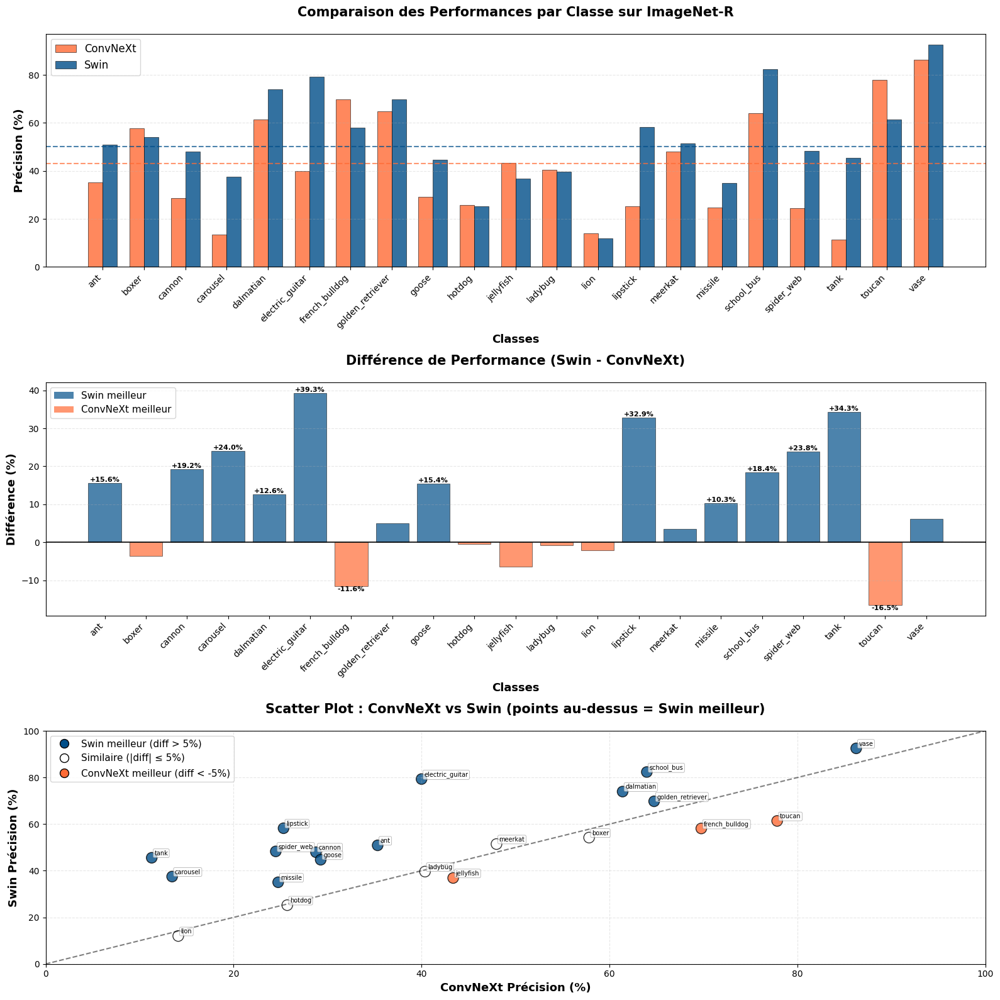

 Graphique sauvegardé : step4/interpretability_results/performance_comparison.png


In [26]:
# Visualisation 1 : Barres comparatives
fig, axes = plt.subplots(3, 1, figsize=(16, 16))

# Subplot 1 : Comparaison côte à côte
x = np.arange(21)
width = 0.35

bars1 = axes[0].bar(x - width/2, convnext_accs, width, label='ConvNeXt', 
                     color='#FF6B35', alpha=0.8, edgecolor='black', linewidth=0.5)
bars2 = axes[0].bar(x + width/2, swin_accs, width, label='Swin', 
                     color='#004E89', alpha=0.8, edgecolor='black', linewidth=0.5)

axes[0].set_xlabel('Classes', fontsize=13, fontweight='bold')
axes[0].set_ylabel('Précision (%)', fontsize=13, fontweight='bold')
axes[0].set_title('Comparaison des Performances par Classe sur ImageNet-R', 
                  fontsize=15, fontweight='bold', pad=20)
axes[0].set_xticks(x)
axes[0].set_xticklabels(CLASS_NAMES, rotation=45, ha='right', fontsize=10)
axes[0].legend(fontsize=12, loc='upper left')
axes[0].grid(axis='y', alpha=0.3, linestyle='--')
axes[0].axhline(y=43.16, color='#FF6B35', linestyle='--', linewidth=1.5, alpha=0.7, label='Moy ConvNeXt')
axes[0].axhline(y=50.19, color='#004E89', linestyle='--', linewidth=1.5, alpha=0.7, label='Moy Swin')

# Subplot 2 : Différences (Swin - ConvNeXt)
colors = ['#004E89' if d > 0 else '#FF6B35' for d in differences]
bars3 = axes[1].bar(x, differences, color=colors, alpha=0.7, edgecolor='black', linewidth=0.5)

# Annoter les barres avec les valeurs
for i, (bar, diff) in enumerate(zip(bars3, differences)):
    if abs(diff) > 10:  # Annoter seulement les grandes différences
        height = bar.get_height()
        axes[1].text(bar.get_x() + bar.get_width()/2., height,
                    f'{diff:+.1f}%', ha='center', va='bottom' if height > 0 else 'top',
                    fontsize=8, fontweight='bold')

axes[1].axhline(y=0, color='black', linestyle='-', linewidth=1.2)
axes[1].set_xlabel('Classes', fontsize=13, fontweight='bold')
axes[1].set_ylabel('Différence (%)', fontsize=13, fontweight='bold')
axes[1].set_title('Différence de Performance (Swin - ConvNeXt)', 
                  fontsize=15, fontweight='bold', pad=20)
axes[1].set_xticks(x)
axes[1].set_xticklabels(CLASS_NAMES, rotation=45, ha='right', fontsize=10)
axes[1].grid(axis='y', alpha=0.3, linestyle='--')

# Légende personnalisée
from matplotlib.patches import Patch
legend_elements = [Patch(facecolor='#004E89', alpha=0.7, label='Swin meilleur'),
                   Patch(facecolor='#FF6B35', alpha=0.7, label='ConvNeXt meilleur')]
axes[1].legend(handles=legend_elements, fontsize=11, loc='upper left')

# Subplot 3 : Scatter plot ConvNeXt vs Swin avec code couleur discret
# Définir les couleurs selon les différences
scatter_colors = []
for diff in differences:
    if diff > 5:  # Swin meilleur
        scatter_colors.append('#004E89')
    elif diff < -5:  # ConvNeXt meilleur
        scatter_colors.append('#FF6B35')
    else:  # Similaire
        scatter_colors.append('white')

scatter = axes[2].scatter(convnext_accs, swin_accs, s=150, alpha=0.8, 
                          c=scatter_colors, edgecolors='black', linewidth=1)
axes[2].plot([0, 100], [0, 100], 'k--', linewidth=1.5, alpha=0.5, label='Égalité parfaite')

# Annoter TOUS les points avec les noms de classes
for i, (cx, sy, name) in enumerate(zip(convnext_accs, swin_accs, CLASS_NAMES)):
    axes[2].annotate(name, (cx, sy), fontsize=7, 
                    xytext=(3, 3), textcoords='offset points',
                    bbox=dict(boxstyle='round,pad=0.2', facecolor='white', 
                             edgecolor='gray', alpha=0.7, linewidth=0.5))

axes[2].set_xlabel('ConvNeXt Précision (%)', fontsize=13, fontweight='bold')
axes[2].set_ylabel('Swin Précision (%)', fontsize=13, fontweight='bold')
axes[2].set_title('Scatter Plot : ConvNeXt vs Swin (points au-dessus = Swin meilleur)', 
                  fontsize=15, fontweight='bold', pad=20)
axes[2].grid(alpha=0.3, linestyle='--')
axes[2].set_xlim([0, 100])
axes[2].set_ylim([0, 100])

# Légende personnalisée pour le scatter plot
from matplotlib.lines import Line2D
legend_elements_scatter = [
    Line2D([0], [0], marker='o', color='w', markerfacecolor='#004E89', 
           markersize=10, label='Swin meilleur (diff > 5%)', markeredgecolor='black'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='white', 
           markersize=10, label='Similaire (|diff| ≤ 5%)', markeredgecolor='black'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='#FF6B35', 
           markersize=10, label='ConvNeXt meilleur (diff < -5%)', markeredgecolor='black')
]
axes[2].legend(handles=legend_elements_scatter, fontsize=11, loc='upper left')

plt.tight_layout()
plt.savefig('step4/interpretability_results/performance_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

print(" Graphique sauvegardé : step4/interpretability_results/performance_comparison.png")

Nous observons, d'après les graphe, un différence flagrante de la performance du transformer pour la plupart des classes par rapport au CNN. En effet, 
- **Pour les points au dessus de la diagonale** 
  - Swin a une meilleure précision que ConvNeXt
  - **Exemple** : `electric_guitar` (40% vs 79%) 

- **Pour les points en dessous de la diagonale** 
  - ConvNeXt a une meilleure précision que Swin
  - Plus le point est loin en-dessous, plus ConvNeXt est supérieur
  - **Exemple** : `toucan` (78% vs 61%) → point très bas

- **pour la points sur la diagonale** 
  - Nous avons des performances équivalentes entre les deux modèles
  - **Exemple** : `ladybug`, `hotdog`



A présent, nous allons étudier l'interpretabilité des deux modèles pour comprendre pourquoi Swin transformer marche beaucoup mieux pour certaines classes comme **electric_guitar** et pourquoi Convnext marche mieux pour classifier d'autres classe comme la classe **toucan**. Nous allons utiliser **GRAD-CAM** pour le CNN pour générer des cartes de saillance a continuer pour swin

### 2.  Interpretabilité des deux modèle en utilisant Grad-CAM, Integrated Gradient et Occlusion

Utilisation du module `step4/utils.py` pour une analyse approfondie des prédictions

Dans cette section, nous allons visualiser et comparer différentes cartes d’interprétabilité générées pour plusieurs classes du jeu de test ImageNet-R-mini, à l’aide de trois méthodes : Grad-CAM, Integrated Gradients et Occlusion.

- Grad-CAM : met en évidence les régions de l’image qui contribuent le plus à la prédiction d’un modèle. Pour une classe c, Grad-CAM calcule les gradients de la sortie $y^c$ par rapport aux activations d'une couche intermédiaire $A^k$ : $\frac{\partial y^c}{\partial A^k}$. On effectue ensuite une moyenne globale des gradients sur les dimensions spatiales pour obtenir un poids pour chaque canal. Bien que conçue pour les CNN, cette méthode s’applique aussi à Swin, car ses blocs produisent des représentations spatiales sur lesquelles on peut calculer des gradients.

- Integrated Gradients : attribue à chaque pixel une importance en intégrant le gradient du score de la classe cible F(x) le long d’un chemin entre une image de référence $x'$ (souvent une image noire) et l’image d’entrée 
x.

- Occlusion consiste à masquer successivement différentes parties de l’image et à observer l’impact de ces masques sur la sortie du modèle. Les cartes obtenues, appelées cartes d’occlusion ou cartes de sensibilité, indiquent quelles régions sont essentielles à la prédiction : plus la performance du modèle chute lorsqu’une zone est masquée, plus cette zone est jugée importante.



In [27]:
import importlib

from step4 import utils

importlib.reload(utils)
print("✓ step4.utils reloaded with importlib")
from step4.utils import analyze_sample

✓ step4.utils reloaded with importlib


In [28]:
# Importer les fonctions du module utils
from step4.utils import (
    load_models, 
    find_prediction_cases, 
    analyze_sample,
    CLASS_NAMES
)
import torch

print("✓ Module utils.py importé avec succès")
print(f"✓ {len(CLASS_NAMES)} classes disponibles: {', '.join(CLASS_NAMES)}")
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"✓ Utilisation de l'appareil : {device}")

✓ Module utils.py importé avec succès
✓ 21 classes disponibles: ant, boxer, cannon, carousel, dalmatian, electric_guitar, french_bulldog, golden_retriever, goose, hotdog, jellyfish, ladybug, lion, lipstick, meerkat, missile, school_bus, spider_web, tank, toucan, vase
✓ Utilisation de l'appareil : cuda


In [29]:
import sys
from pathlib import Path

# Ajouter le dossier step4 au path
# sys.path.insert(0, str(Path.cwd() / 'step4'))

# Importer les fonctions du dataloader
from step4.dataloader import get_test_loader, imshow_batch

# Charger le dataloader
test_loader, class_names = get_test_loader()
print(f"\n Classes : {class_names}")
print(f"   Nombre de classes : {len(class_names)}\n")

 Dataset de TEST chargé depuis : /home/essakhi/5A/minis-projets/HDDL_Projects/mini-project-3/step4/data/imagenet-r-mini
   - Nombre d'images : 3740
   - Classes trouvées : ['ant', 'boxer', 'cannon', 'carousel', 'dalmatian', 'electric_guitar', 'french_bulldog', 'golden_retriever', 'goose', 'hotdog', 'jellyfish', 'ladybug', 'lion', 'lipstick', 'meerkat', 'missile', 'school_bus', 'spider_web', 'tank', 'toucan', 'vase']

 Classes : ['ant', 'boxer', 'cannon', 'carousel', 'dalmatian', 'electric_guitar', 'french_bulldog', 'golden_retriever', 'goose', 'hotdog', 'jellyfish', 'ladybug', 'lion', 'lipstick', 'meerkat', 'missile', 'school_bus', 'spider_web', 'tank', 'toucan', 'vase']
   Nombre de classes : 21



In [30]:
# Charger les modèles depuis utils
convnext_model, swin_model = load_models(device=device)

print("✓ Modèles chargés depuis utils.py")
print(f"  ConvNeXt: {sum(p.numel() for p in convnext_model.parameters()):,} paramètres")
print(f"  Swin: {sum(p.numel() for p in swin_model.parameters()):,} paramètres")

 Chargement de ConvNeXt-Tiny (SOTA CNN)...
 Chargement de Swin Transformer-Tiny (SOTA ViT)...
✓ Modèles chargés depuis utils.py
  ConvNeXt: 27,836,277 paramètres
  Swin: 27,535,503 paramètres


In [31]:
# Analyse globale de tous les cas de prédiction
all_cases = find_prediction_cases(convnext_model, swin_model, test_loader, device=device)


ImageNet-R-mini Analysis:
  Both correct: 1285 (34.4%)
  CNN wrong, Swin right: 592 (15.8%)
  Swin wrong, CNN right: 329 (8.8%)
  Both wrong: 1534 (41.0%)



###  Analyse par Classe Spécifique
Proportions des images du dataset où les deux modèles réussissent / échouent où l'un échoue et l'autre réussit pour une classe donnée.

In [32]:
# ===== CONFIGURATION : CHOISIR UNE CLASSE =====
TARGET_CLASS = 'electric_guitar'  # Changez ici pour analyser une autre classe


class_idx = CLASS_NAMES.index(TARGET_CLASS)
print(f"\n Analyse de la classe : {TARGET_CLASS} (index {class_idx})")

# Trouver les cas pour cette classe spécifique
class_cases = find_prediction_cases(
    convnext_model, 
    swin_model, 
    test_loader, 
    device=device, 
    class_filter=class_idx
)


 Analyse de la classe : electric_guitar (index 5)

ImageNet-R-mini Analysis for class 'electric_guitar':
  Both correct: 58 (38.7%)
  CNN wrong, Swin right: 61 (40.7%)
  Swin wrong, CNN right: 2 (1.3%)
  Both wrong: 29 (19.3%)



Pour la classe **electric_guitar**, comme noté auparavant, nous observons que les performances du Swin dépassent largement celles du CNN. En effet, le Swin n'échoue quand dans 20ù des cas contrairement au CNN qui échoue dans la classificaiton de 60% des images. Interpretons ce résultat :  

- ###   **Cas où Swin Réussit mais ConvNeXt Échoue**


 Analyse d'un cas où SWIN réussit mais CONVNEXT échoue
   Index dans le dataset: 694


Analyzing Sample 694 from ImageNet-R-mini
Ground Truth: electric_guitar (5)
ConvNeXt Prediction: vase (✗)
Swin Prediction: electric_guitar (✓)

Computing GradCAM comparison...


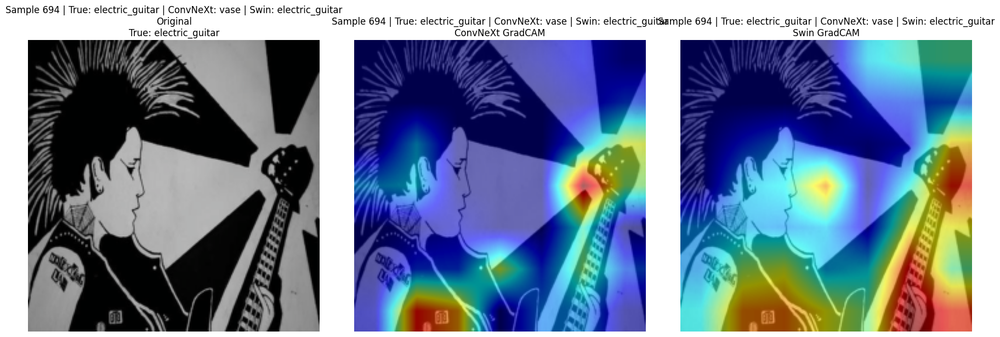

Computing Integrated Gradients comparison...


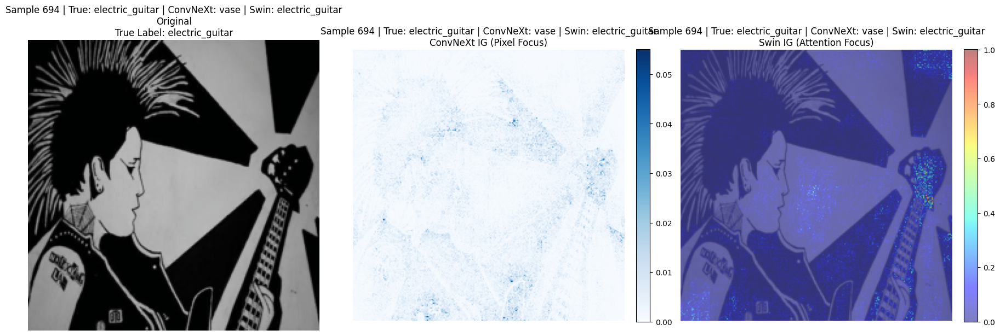

Computing Occlusion comparison...


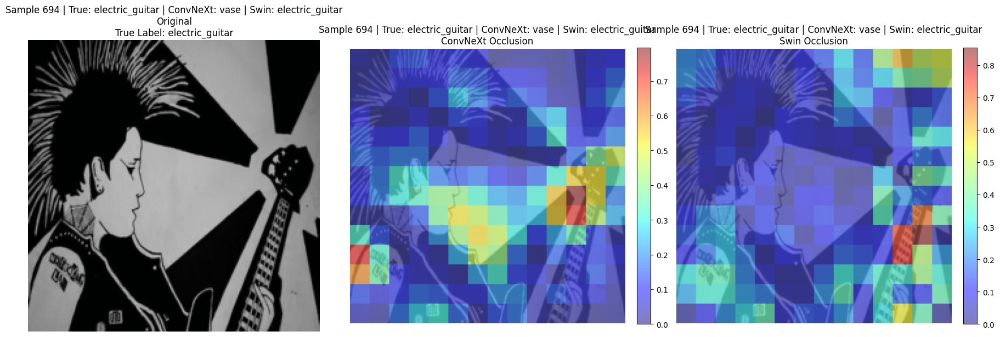

In [33]:
# Analyser un exemple où SWIN réussit mais CONVNEXT échoue
if len(class_cases['cnn_wrong_swin_right']) > 0:
    # Prendre le premier cas
    sample_idx = class_cases['cnn_wrong_swin_right'][21]
    print(f"\n Analyse d'un cas où SWIN réussit mais CONVNEXT échoue")
    print(f"   Index dans le dataset: {sample_idx}\n")
    
    analyze_sample(
        convnext_model, 
        swin_model, 
        test_loader, 
        sample_idx, 
        device=device,
        methods=['gradcam', 'ig', 'occlusion']
    )
else:
    print(f" Aucun cas où Swin réussit et ConvNeXt échoue pour la classe '{TARGET_CLASS}'")


 Analyse d'un cas où SWIN réussit mais CONVNEXT échoue
   Index dans le dataset: 677


Analyzing Sample 677 from ImageNet-R-mini
Ground Truth: electric_guitar (5)
ConvNeXt Prediction: french_bulldog (✗)
Swin Prediction: electric_guitar (✓)

Computing GradCAM comparison...


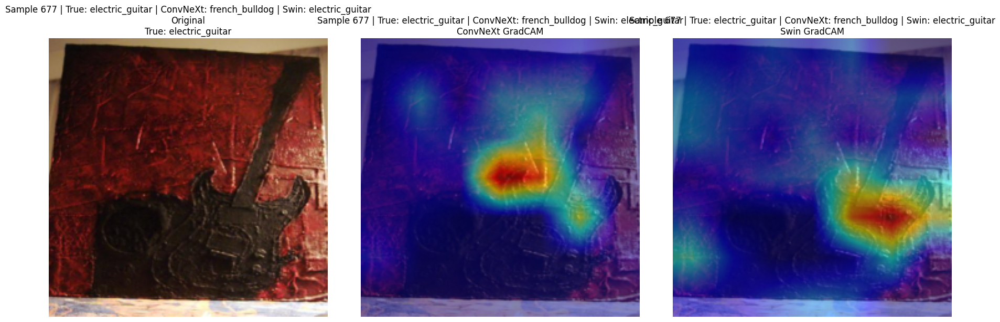

Computing Integrated Gradients comparison...


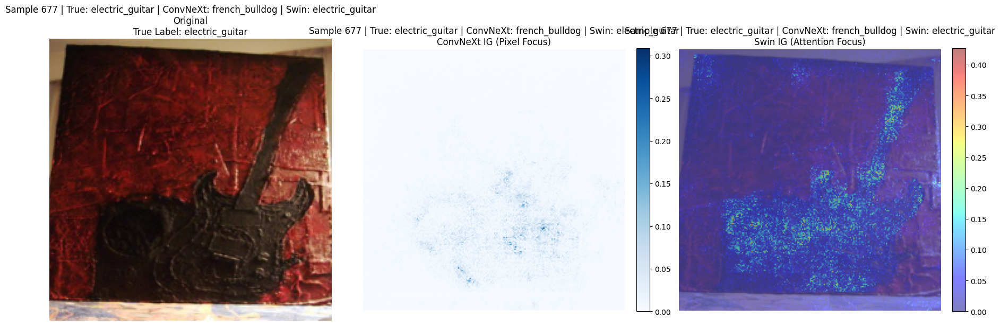

Computing Occlusion comparison...


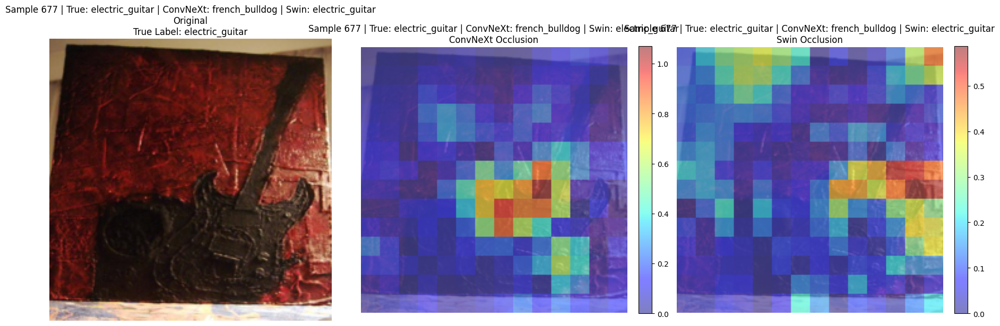

In [34]:
# Analyser un exemple où SWIN réussit mais CONVNEXT échoue
if len(class_cases['cnn_wrong_swin_right']) > 0:
    # Prendre le premier cas
    sample_idx = class_cases['cnn_wrong_swin_right'][18]
    print(f"\n Analyse d'un cas où SWIN réussit mais CONVNEXT échoue")
    print(f"   Index dans le dataset: {sample_idx}\n")
    
    analyze_sample(
        convnext_model, 
        swin_model, 
        test_loader, 
        sample_idx, 
        device=device,
        methods=['gradcam', 'ig', 'occlusion']
    )
else:
    print(f" Aucun cas où Swin réussit et ConvNeXt échoue pour la classe '{TARGET_CLASS}'")

En observant les cartes des différentes images où Swin prédit la bonne classe et ConvNext se trompe, nous pouvons remarquer que le Swin a tendance à connecter le "manche" au "corps" de la guitare. Ce qui fait que l'attention est globale sur toute la longueur de l'objet. 

Le CNN quand à lui se focalise sur des petits détails isolés comme des géométries, des couleurs ou encore pire le fond. 
En effet, le Convnext prédit généralement les guitares noires comme étant des french bulldogs. L'échantillon d'entrainement de image net mini pour la classe bulldog contient une majorité de bull dogs noirs ce qui induit que le cnn se trompe parcequ'il se focalise sur le detail de la couleur. Ceci se reflète notamment pour l'image au dessus (n°18) . Pour cette même image le Swin arrive a détécter la texture et tout l'objet. Le problème est similaire pour des images de couleur rouge / vert où il prédit la classe toucan (couleur du bec du toucan)
Le CNN prédit également beaucoup de guitares comme étant des vases parcequ'il ne détécte que la courbure spécifique (jonction du corps) de la guitare de la manche au corps . 

- ###  **Cas où ConvNeXt Réussit mais Swin Échoue : classe toucan** 

In [35]:
# ===== CONFIGURATION : CHOISIR UNE CLASSE =====
TARGET_CLASS = 'toucan'  # Changez ici pour analyser une autre classe


class_idx = CLASS_NAMES.index(TARGET_CLASS)
print(f"\n Analyse de la classe : {TARGET_CLASS} (index {class_idx})")

# Trouver les cas pour cette classe spécifique
class_cases = find_prediction_cases(
    convnext_model, 
    swin_model, 
    test_loader, 
    device=device, 
    class_filter=class_idx
)


 Analyse de la classe : toucan (index 19)

ImageNet-R-mini Analysis for class 'toucan':
  Both correct: 207 (58.8%)
  CNN wrong, Swin right: 9 (2.6%)
  Swin wrong, CNN right: 67 (19.0%)
  Both wrong: 69 (19.6%)




 Analyse d'un cas où CONVNEXT réussit mais SWIN échoue
   Index dans le dataset: 3267


Analyzing Sample 3267 from ImageNet-R-mini
Ground Truth: toucan (19)
ConvNeXt Prediction: toucan (✓)
Swin Prediction: vase (✗)

Computing GradCAM comparison...


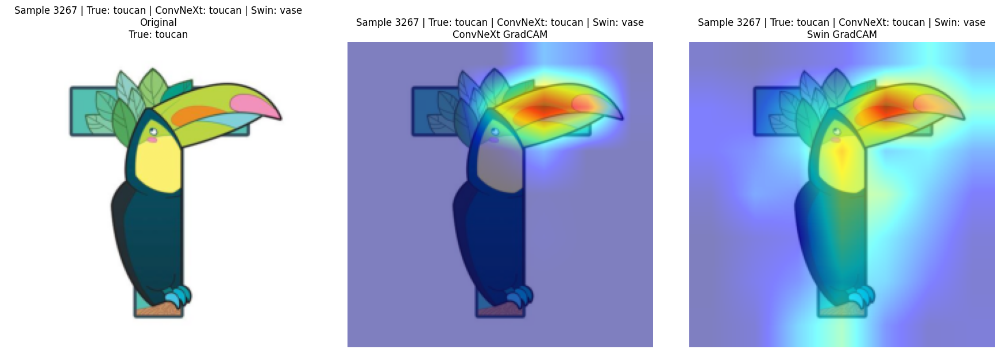

Computing Integrated Gradients comparison...


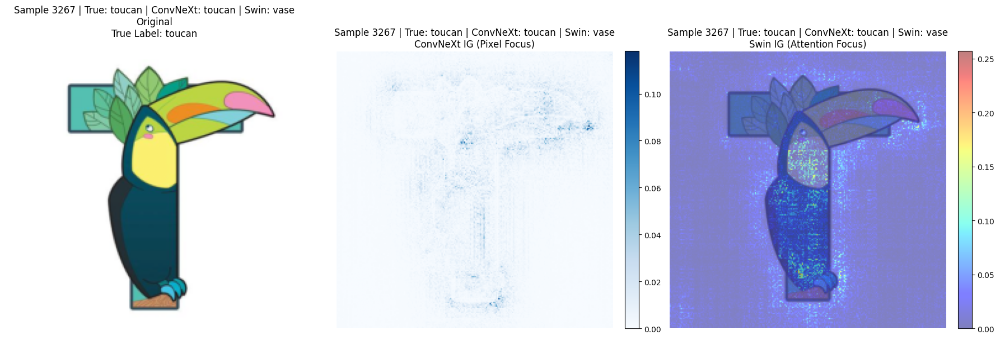

Computing Occlusion comparison...


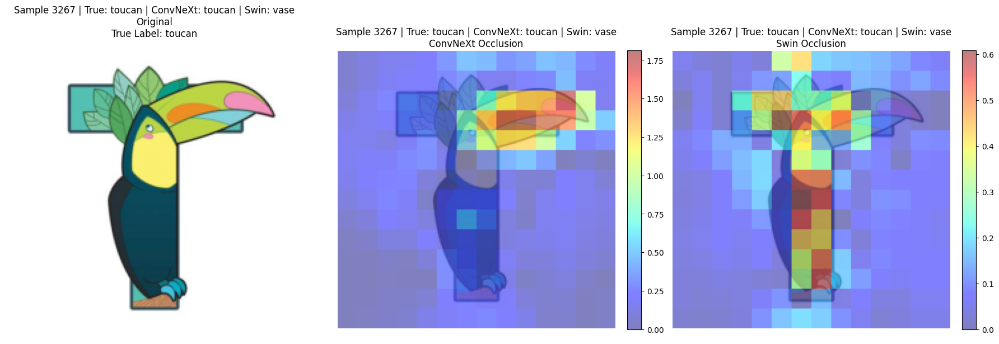

In [36]:
# Analyser un exemple où CONVNEXT réussit mais SWIN échoue
if len(class_cases['swin_wrong_cnn_right']) > 0:
    # Prendre le premier cas
    sample_idx = class_cases['swin_wrong_cnn_right'][6]
    print(f"\n Analyse d'un cas où CONVNEXT réussit mais SWIN échoue")
    print(f"   Index dans le dataset: {sample_idx}\n")
    
    analyze_sample(
        convnext_model, 
        swin_model, 
        test_loader, 
        sample_idx, 
        device=device,
        methods=['gradcam', 'ig', 'occlusion']
    )
else:
    print(f" Aucun cas où ConvNeXt réussit et Swin échoue pour la classe '{TARGET_CLASS}'")

Le toucan se définit par une caractéristique locale hyper forte : son bec. Les CNN sont des experts de la détection de features locales très discriminantes. Les Transformers, en essayant de regarder "tout le contexte" se font parasiter par le bruit. Ceci justifie la meilleure performance du CNN (77.84%) sur cette classe par rapport au transformer (61%).

- Pour le ConvNext, La zone rouge est hyper concentrée sur le bec et l'œil (détéction de la feature principale du toucan)
- Alors que pour le Swin, son attention est trop diffuse et il lui arrive de rater le bec pour regarder le corps noir ou le fond.

- ###  **Effet de la structure géométrique**

In [37]:
# ===== CONFIGURATION : CHOISIR UNE CLASSE =====
TARGET_CLASS = 'spider_web'  # Changez ici pour analyser une autre classe


class_idx = CLASS_NAMES.index(TARGET_CLASS)
print(f"\n Analyse de la classe : {TARGET_CLASS} (index {class_idx})")

# Trouver les cas pour cette classe spécifique
class_cases = find_prediction_cases(
    convnext_model, 
    swin_model, 
    test_loader, 
    device=device, 
    class_filter=class_idx
)


 Analyse de la classe : spider_web (index 17)

ImageNet-R-mini Analysis for class 'spider_web':
  Both correct: 35 (23.8%)
  CNN wrong, Swin right: 36 (24.5%)
  Swin wrong, CNN right: 1 (0.7%)
  Both wrong: 75 (51.0%)



Même si les performances générales des deux modèles ne sont pas très hautes, le Swin s'avère quand même meilleur


 Analyse d'un cas où SWIN réussit mais CONVNEXT échoue
   Index dans le dataset: 2852


Analyzing Sample 2852 from ImageNet-R-mini
Ground Truth: spider_web (17)
ConvNeXt Prediction: vase (✗)
Swin Prediction: spider_web (✓)

Computing GradCAM comparison...


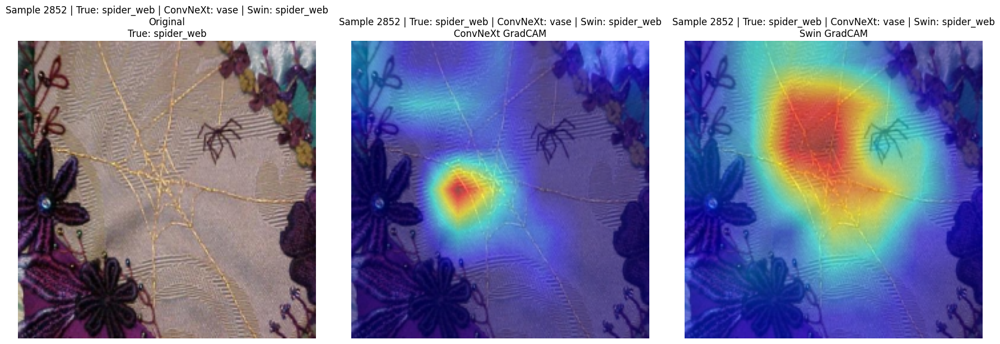

Computing Integrated Gradients comparison...


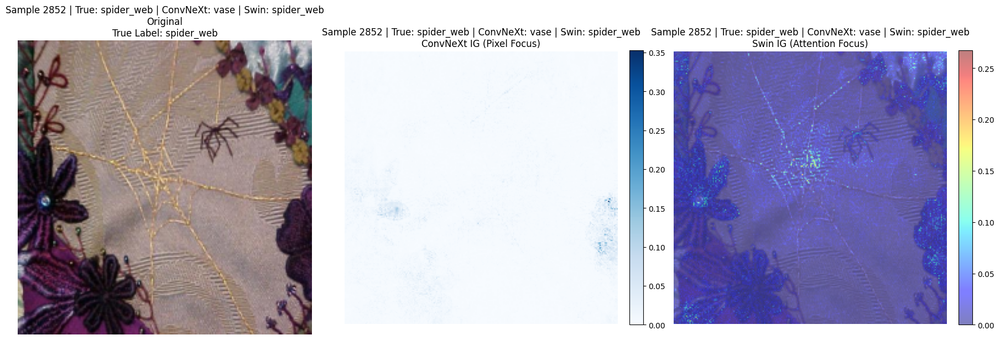

Computing Occlusion comparison...


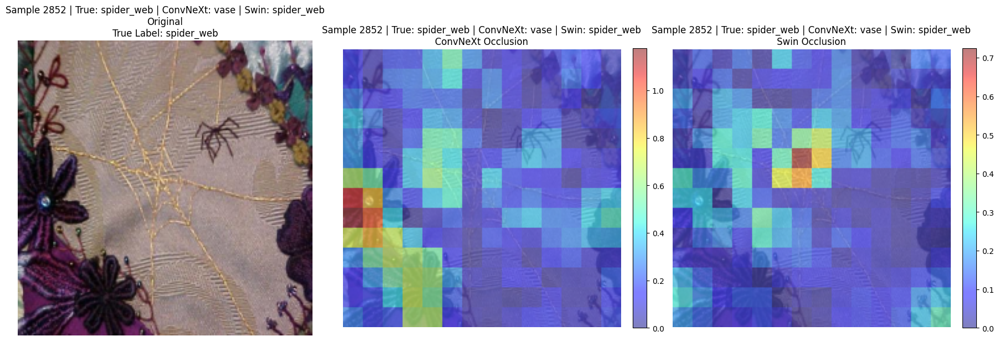

In [38]:
# Analyser un exemple où SWIN réussit mais CONVNEXT échoue
if len(class_cases['cnn_wrong_swin_right']) > 0:
    # Prendre le premier cas
    sample_idx = class_cases['cnn_wrong_swin_right'][4]
    print(f"\n Analyse d'un cas où SWIN réussit mais CONVNEXT échoue")
    print(f"   Index dans le dataset: {sample_idx}\n")
    
    analyze_sample(
        convnext_model, 
        swin_model, 
        test_loader, 
        sample_idx, 
        device=device,
        methods=['gradcam', 'ig', 'occlusion']
    )
else:
    print(f" Aucun cas où Swin réussit et ConvNeXt échoue pour la classe '{TARGET_CLASS}'")

Le cas de la classe spider_web est un cas intéressant car une toile d'araignée n'a aucune texture. Ce n'est que de la géométrie pure (des lignes fines). Chose que les convolutions ont tendance à effacer. A l'opposé, le mécanisme d'attention du Swin excelle à relier des points distants (les nœuds de la toile). On peut observer ceci dans la figure ci dessus où l'on peut voir d'après la carte d'integrated gradients que le Swin arrive à "allumer" les fils de la toile, alors que ConvNeXt regarde le fond/vide. 